# **Project Title**

#### **Team Members**
*   Nihal Ahmed Mannath
*   Michele Cobelli
*   Salvador Cantuarias

#### **Project description** *(max 150 words)*
The project aims to detect and classify the type of greenery elements in a satellite image using color and edge detection.
The project is located in

*Please include the following:*
*   Where is the project situated?
*   What is the research aim?
*   What methods did you use?
*   What KPI's did you extract and why?

#### **Project Results**
*(bullet points with key outcomes and learnings)*
*   Outcomes
*   Limitations
*   Future Work









## **Dependencies**


> Install required libraries



In [107]:
import io
from io import BytesIO
import requests
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import math
import os
import cv2

In [108]:
import ee
import geemap

In [109]:
ee.Authenticate()
ee.Initialize(project='ee-salvadorcantuarias')

## **Select Location**


> Extract satellite images based on longitude, latitude and bbox




### Calculate Zoom

In [110]:
def calculate_zoom_for_physical_size(lat, physical_size_meters, width_pixels=800):
    """
    Calculate appropriate zoom level for a specific physical area.

    This function determines which zoom level will display the area at
    the desired physical size with appropriate resolution.
    """
    # Earth's circumference at the equator in meters
    earth_circumference = 40075016.686

    # At zoom level 0, the entire world is 256 pixels wide
    meters_per_pixel_at_zoom_0 = earth_circumference / 256

    # Adjust for latitude (distances get smaller as you move away from equator)
    meters_per_pixel_at_lat_zoom_0 = meters_per_pixel_at_zoom_0 * np.cos(np.radians(lat))

    # Calculate how many meters each pixel needs to represent
    meters_per_pixel_needed = physical_size_meters / width_pixels

    # Calculate the zoom level where pixels will represent this physical size
    # Each zoom level doubles the detail (halves the physical size per pixel)
    zoom = np.log2(meters_per_pixel_at_lat_zoom_0 / meters_per_pixel_needed)

    # Round and clamp to valid zoom range (1-19)
    return max(1, min(19, round(zoom)))

### Download Large Satellite image

In [111]:
def download_large_satellite_image(lat, lon, width_meters, height_meters, resolution, output_file=None):
    """
    Download a large satellite image covering the specified area.

    This is the main function that determines the appropriate zoom level
    and dimensions for the image, then downloads it.
    """
    # Calculate zoom level based on the larger dimension
    # This ensures we get the right level of detail
    larger_dimension_meters = max(width_meters, height_meters)
    zoom = calculate_zoom_for_physical_size(lat, larger_dimension_meters, resolution)

    # Calculate actual meters per pixel at this zoom level
    # This tells us the ground resolution of our image
    earth_circumference = 40075016.686
    meters_per_pixel = (earth_circumference * np.cos(np.radians(lat))) / (256 * (2 ** zoom))

    # Calculate required image dimensions in pixels
    # This converts our desired physical dimensions to pixel dimensions
    width_pixels = int(width_meters / meters_per_pixel)
    height_pixels = int(height_meters / meters_per_pixel)

    print(f"Downloading {width_meters}m × {height_meters}m area at zoom level {zoom}")
    print(f"Image dimensions: {width_pixels}px × {height_pixels}px")
    print(f"Resolution: {meters_per_pixel:.2f} meters per pixel")

    # Use the download function to get the actual image
    image, ndvi_image= download_esri_satellite_image(lat, lon, width_pixels, height_pixels, zoom, output_file)


    # Return the image and actual dimensions
    # The actual dimensions might differ slightly from requested due to rounding
    actual_width_meters = width_pixels * meters_per_pixel
    actual_height_meters = height_pixels * meters_per_pixel

    return image,ndvi_image,actual_width_meters, actual_height_meters

###  Get ndvi

In [112]:
def get_ndvi_ndbi_image(year, x_min, y_min, x_max, y_max):

    '''
    year = 2015
    lat = 41.396536
    lon = 2.194554
    width_meters = 2000
    height_meters = 2000

    # Calculate latitude and longitude offsets
    lat_offset = (height_meters / 111320) / 2  # Approx. meters per degree latitude
    lon_offset = (width_meters / (111320 * np.cos(np.radians(lat)))) / 2  # Adjust for latitude

    # Calculate bbox coordinates
    bbox = {
        "min_lon": lon - lon_offset,
        "min_lat": lat - lat_offset,
        "max_lon": lon + lon_offset,
        "max_lat": lat + lat_offset
    }

    print("Bounding Box Coordinates:")
    print(f"Min Longitude: {bbox['min_lon']}")
    print(f"Min Latitude: {bbox['min_lat']}")
    print(f"Max Longitude: {bbox['max_lon']}")
    print(f"Max Latitude: {bbox['max_lat']}")

    roi = ee.Geometry.Rectangle([bbox['min_lon'],bbox['min_lat'],bbox['max_lon'],bbox['max_lat']])'''
    roi = ee.Geometry.BBox(x_min,y_min,x_max,y_max)


    if year <= 2011:
        collection = 'LANDSAT/LT05/C02/T1'
        red, nir, swir = 'B3', 'B4', 'B5'
    else:
        collection = 'LANDSAT/LC08/C02/T1'
        red, nir, swir = 'B4', 'B5', 'B6'

    image = (ee.ImageCollection(collection)
        .filterBounds(roi)
        .filterDate(f"{year}-01-01", f"{year}-12-31")
        .filter(ee.Filter.lt('CLOUD_COVER', 30))
        .sort('CLOUD_COVER')
        .first())

    if image is None:
        print(f"⚠ No suitable image found for {year}")
        return None

    ndvi = image.normalizedDifference([nir, red]).rename('NDVI')
    ndbi = image.normalizedDifference([swir, nir]).rename('NDBI')

    ndvi_img = ndvi.clip(roi)
    ndbi_img = ndbi.clip(roi)

    stats = ee.Image.cat([ndvi_img, ndbi_img]).reduceRegion(
        reducer=ee.Reducer.percentile([2, 98]),
        geometry=roi,
        scale=30,
        maxPixels=1e9
    ).getInfo()

    ndvi_min = stats.get('NDVI_p2')
    ndvi_max = stats.get('NDVI_p98')
    ndbi_min = stats.get('NDBI_p2')
    ndbi_max = stats.get('NDBI_p98')

    if None in [ndvi_min, ndvi_max, ndbi_min, ndbi_max]:
        print(f"⚠ Skipping year {year}: insufficient image data.")
        return None

    ndvi_norm = ndvi_img.subtract(ndvi_min).divide(ndvi_max - ndvi_min).clamp(0, 1)
    ndbi_norm = ndbi_img.subtract(ndbi_min).divide(ndbi_max - ndbi_min).clamp(0, 1)

    composite = ndvi_norm.addBands(ndbi_norm).addBands(ndvi_norm)

    url = composite.getThumbURL({
        'region': roi,
        'dimensions': 1024,
        'format': 'PNG',
        'min': 0,
        'max': 1
    })

    # Download into a PIL image
    response = requests.get(url)
    pil = Image.open(BytesIO(response.content)).convert('RGBA')

    # 1) Mask no-data (all-black) to white
    arr = np.array(pil)
    nodata_mask = np.all(arr[..., :3] == 0, axis=2)
    # white + full alpha
    arr[nodata_mask] = [255, 255, 255, 255]
    pil = Image.fromarray(arr)

    # 2) Rotate to deskew (adjust angle in degrees)
    angle = 1   # try -15, -10, etc. until it’s level
    pil = pil.rotate(angle, expand=True, fillcolor=(255,255,255,255))

        # ---- MANUAL UNIFORM OFFSET CROP ----
    # Set this to however many pixels you want to shave off each border
    crop_offset = 25

    w, h = pil.size
    # (left, upper, right, lower)
    pil = pil.crop((
        crop_offset,            # left
        crop_offset,            # top
        w - crop_offset,        # right
        h - crop_offset         # bottom
    ))
    # ------------------------------------


    # Return final array
    img_rgba = np.array(pil)
    return img_rgba

### Download esri satellite image

In [113]:
def download_esri_satellite_image(lat, lon, width, height, zoom, output_file=None):
    """
    Download a satellite image from ESRI World Imagery service.

    This function handles the actual downloading of tiles from the
    ESRI map service and stitches them together.
    """
    # These helper functions convert geographic coordinates to tile coordinates
    # This is how we determine which map tiles to download
    def lon_to_x(lon, zoom):
        return ((lon + 180) / 360) * (2 ** zoom)

    def lat_to_y(lat, zoom):
        lat_rad = math.radians(lat)
        return (1 - math.log(math.tan(lat_rad) + 1/math.cos(lat_rad)) / math.pi) / 2 * (2 ** zoom)

    # Calculate the center tile coordinates
    x_tile = lon_to_x(lon, zoom)
    y_tile = lat_to_y(lat, zoom)

    # Create a blank image to hold our map
    result = Image.new('RGB', (width, height))
    result_ndvi = Image.new('RGB', (width, height))

    # Calculate the range of tiles we need to download
    # Map tiles are 256×256 pixels, so we calculate how many we need
    x_min = int(x_tile - (width / 256) / 2)
    y_min = int(y_tile - (height / 256) / 2)
    x_max = int(x_tile + (width / 256) / 2) + 1
    y_max = int(y_tile + (height / 256) / 2) + 1

    # Track download progress
    total_tiles = (x_max - x_min) * (y_max - y_min)
    tiles_downloaded = 0
    ndvi_tiles_downloaded = 0

    print(f"Downloading {total_tiles} map tiles...")

    # Download each tile and stitch them together
    # This loops through all the tiles we need and downloads each one
    for x in range(x_min, x_max):
        for y in range(y_min, y_max):

            tile_bbox = {
                "min_lon": x / (2 ** zoom) * 360 - 180,
                "max_lon": (x + 1) / (2 ** zoom) * 360 - 180,
                "min_lat": math.degrees(math.atan(math.sinh(math.pi * (1 - 2 * y / (2 ** zoom))))),
                "max_lat": math.degrees(math.atan(math.sinh(math.pi * (1 - 2 * (y + 1) / (2 ** zoom)))))
            }
            print(f"Tile BBox: {tile_bbox}")

            try:
                # Generate NDVI tile
                ndvi_tile = get_ndvi_ndbi_image(
                    2015, 
                    tile_bbox["min_lon"], 
                    tile_bbox["min_lat"], 
                    tile_bbox["max_lon"], 
                    tile_bbox["max_lat"]
                )
                if ndvi_tile is not None:
                    paste_x = (x - x_min) * 256
                    paste_y = (y - y_min) * 256
                    result_ndvi.paste(Image.fromarray(ndvi_tile), (paste_x, paste_y))
            except Exception as e:
                print(f"Error generating NDVI tile for {x},{y}: {e}")

            # ESRI World Imagery tile URL format
            url = f"https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{zoom}/{y}/{x}"

            try:
                # Download the tile
                response = requests.get(url)
                if response.status_code == 200:
                    # Convert the response to an image
                    tile = Image.open(io.BytesIO(response.content))

                    # Calculate where to paste this tile in our result image
                    paste_x = (x - x_min) * 256
                    paste_y = (y - y_min) * 256

                    # Paste the tile into the result image
                    result.paste(tile, (paste_x, paste_y))
                    result_ndvi.paste(ndvi_tile, (paste_x, paste_y))

                    # Update progress
                    tiles_downloaded += 1
                    if tiles_downloaded % 10 == 0 or tiles_downloaded == total_tiles:
                        print(f"Downloaded {tiles_downloaded}/{total_tiles} tiles ({tiles_downloaded/total_tiles*100:.1f}%)")
                    ndvi_tiles_downloaded += 1
                    if ndvi_tiles_downloaded % 10 == 0 or ndvi_tiles_downloaded == total_tiles:
                        print(f"Downloaded {ndvi_tiles_downloaded}/{total_tiles} NDVI tiles ({ndvi_tiles_downloaded/total_tiles*100:.1f}%)")

            except Exception as e:
                print(f"Error downloading tile {x},{y}: {e}")

    # Crop image to exact dimensions
    # This ensures we get exactly the size we requested
    center_x = (width // 2)
    center_y = (height // 2)
    left = center_x - (width // 2)
    upper = center_y - (height // 2)
    right = center_x + (width // 2)
    lower = center_y + (height // 2)

    result = result.crop((left, upper, right, lower))
    result_ndvi = result_ndvi.crop((left, upper, right, lower))

    # Save if output file specified
    if output_file:
        result.save(output_file)
        result_ndvi.save(output_file.replace('.png', '_ndvi.png'))
        print(f"Image saved to {output_file}")
        print(f"Large image saved to {output_file}")

    return result, result_ndvi

### Grid overlay

In [114]:
def add_grid_overlay(image, rows, cols, output_file=None):
    """
    Add a grid overlay to an image with row and column labels.

    This function adds a visual grid showing how the image will be divided,
    with coordinates for each tile.
    """
    # Create a copy of the image to draw on
    overlay_image = image.copy().convert('RGBA')
    draw = ImageDraw.Draw(overlay_image)

    # Get image dimensions
    width, height = image.size

    # Calculate tile dimensions
    tile_width = width // cols
    tile_height = height // rows

    # Draw vertical grid lines
    for i in range(1, cols):
        x = i * tile_width
        draw.line([(x, 0), (x, height)], fill=(0, 255, 255, 180), width=5)

    # Draw horizontal grid lines
    for i in range(1, rows):
        y = i * tile_height
        draw.line([(0, y), (width, y)], fill=(0, 255, 255, 180), width=5)

    # Draw tile labels
    try:
        # Try to use a TrueType font if available
        font = ImageFont.truetype("arial.ttf", 40)
    except IOError:
        # Fallback to default font
        font = ImageFont.load_default()

    for row in range(rows):
        for col in range(cols):
            # Calculate center of the tile
            center_x = col * tile_width + tile_width // 2
            center_y = row * tile_height + tile_height // 2

            # Draw tile label
            label = f"({row},{col})"

            # Get text size
            try:
                text_bbox = draw.textbbox((0, 0), label, font=font)
                text_width = text_bbox[2] - text_bbox[0]
                text_height = text_bbox[3] - text_bbox[1]
            except AttributeError:
                # For older Pillow versions
                text_width, text_height = draw.textsize(label, font=font)

            # Position the text in the center of the tile
            text_x = center_x - text_width // 2
            text_y = center_y - text_height // 2

            # Draw white rectangle behind text for better visibility
            padding = 5
            draw.rectangle(
                [
                    text_x - padding,
                    text_y - padding,
                    text_x + text_width + padding,
                    text_y + text_height + padding
                ],
                fill=(255, 255, 255, 180)  # Semi-transparent white
            )

            # Draw the text
            draw.text((text_x, text_y), label, fill=(255, 0, 0), font=font)

    # Convert back to RGB for compatibility
    overlay_image = overlay_image.convert('RGB')

    # Save the image if output file specified
    if output_file:
        overlay_image.save(output_file)
        print(f"Grid overlay image saved to {output_file}")

    # Display the image
    plt.figure(figsize=(12, 12))
    plt.imshow(overlay_image)
    plt.title(f"Image with {rows}×{cols} Grid Overlay")
    plt.axis('off')
    plt.show()

    return overlay_image

### Cut image into tiles

In [115]:
def cut_image_into_tiles(image, rows, cols, output_dir=None, base_filename="tile"):
    """
    Cut a single large image into a grid of smaller tiles.

    This function takes the downloaded image and divides it into
    the requested number of smaller tile images.
    """
    # Calculate the dimensions of each tile
    width, height = image.size
    tile_width = width // cols
    tile_height = height // rows

    tiles = []

    # Create output directory if needed
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Cut image into tiles
    # We loop through each row and column, creating a tile for each position
    for row in range(rows):
        for col in range(cols):
            # Calculate tile boundaries in pixels
            left = col * tile_width
            upper = row * tile_height
            right = left + tile_width
            lower = upper + tile_height

            # Crop the tile from the large image
            tile = image.crop((left, upper, right, lower))
            tiles.append(tile)

            # Save the tile if directory specified
            if output_dir:
                tile_filename = f"{base_filename}_r{row}_c{col}.png"
                tile_path = os.path.join(output_dir, tile_filename)
                tile.save(tile_path)
                print(f"Saved tile to {tile_path}")

            # Display the tile
            plt.figure(figsize=(5, 5))
            plt.imshow(tile)
            plt.title(f"Tile ({row},{col})")
            plt.axis('off')
            plt.show()

    return tiles

### Create mosaic of tiles

In [116]:
def create_tile_mosaic(tiles, rows, cols, output_file=None):
    """
    Create a mosaic image from tiles (for visualization).

    This function reassembles the tiles into a single image to verify
    that they fit together correctly.
    """
    # Verify we have the correct number of tiles
    if len(tiles) != rows * cols:
        raise ValueError(f"Expected {rows*cols} tiles, got {len(tiles)}")

    # Get tile dimensions from the first tile
    tile_width, tile_height = tiles[0].size

    # Create a new blank image for the mosaic
    mosaic = Image.new('RGB', (cols * tile_width, rows * tile_height))

    # Paste each tile into the mosaic
    for i, tile in enumerate(tiles):
        # Calculate the row and column from the tile index
        row = i // cols
        col = i % cols

        # Paste the tile at the correct position
        mosaic.paste(tile, (col * tile_width, row * tile_height))

    # Save the mosaic if requested
    if output_file:
        mosaic.save(output_file)
        print(f"Mosaic saved to {output_file}")

    # Display the mosaic
    plt.figure(figsize=(12, 12))
    plt.imshow(mosaic)
    plt.title(f"Tile Mosaic ({rows}×{cols})")
    plt.axis('off')
    plt.show()

    return mosaic

### Get tiles from large image

In [117]:
def get_tiles_from_large_image(lat, lon, area_size_meters, grid_size, resolution=2048, output_dir=None, output_file=None):
    """
    Download a large satellite image and cut it into tiles.

    This is the main function that combines all the steps - downloading,
    previewing, and cutting into tiles.
    """
    rows, cols = grid_size

    # Handle area size parameter
    # Allow either a single value (square) or separate width/height
    if isinstance(area_size_meters, (int, float)):
        width_meters = height_meters = area_size_meters
    else:
        width_meters, height_meters = area_size_meters

    # Generate default output file name if not provided
    if output_file is None:
        output_file = f"satellite_{lat}_{lon}_{width_meters}x{height_meters}m.png"

    # Download the large image
    large_image,ndvi_image,actual_width,actual_height = download_large_satellite_image(
        lat, lon, width_meters, height_meters, resolution, output_file
    )

    print(f"Actual area covered: {actual_width:.1f}m × {actual_height:.1f}m")

    # Create a preview with grid overlay
    grid_preview = add_grid_overlay(
        large_image, rows, cols,
        output_file=output_file.replace('.png', '_grid_preview.png')
    )

    ndvi_grid_preview = add_grid_overlay(
        ndvi_image, rows, cols,
        output_file=output_file.replace('.png', '_ndvi_grid_preview.png')
    )

    # Cut the image into tiles
    base_filename = f"tile_{lat}_{lon}"
    tiles = cut_image_into_tiles(large_image, rows, cols, output_dir, base_filename)

    ndvi_base_filename = f"ndvi_tile_{lat}_{lon}"
    ndvi_tiles = cut_image_into_tiles(ndvi_image, rows, cols, output_dir, ndvi_base_filename)


    # Create a mosaic for visualization
    mosaic = create_tile_mosaic(tiles, rows, cols, f"/home/salvador_cb/3_term/environmental_data_workshop/data/output/mosaic_{lat}_{lon}.png")
    ndvi_mosaic = create_tile_mosaic(ndvi_tiles, rows, cols, f"/home/salvador_cb/3_term/environmental_data_workshop/data/output/ndvi_mosaic_{lat}_{lon}.png")

    # Calculate and display the physical size of each tile
    tile_width_meters = actual_width / cols
    tile_height_meters = actual_height / rows
    print(f"Each tile covers approximately {tile_width_meters:.1f}m × {tile_height_meters:.1f}m")

    return large_image, ndvi_image, tiles

### Barcelona tiling

In [118]:
def example_efficient_tiling():
    """
    Example function showing how to use the tile generator.

    This downloads a 2km x 2km area around Barcelona and cuts it into a 3x3 grid.
    """
    # Barcelona coordinates
    lat = 41.396536
    lon = 2.194554

    #

    # Download a 2km x 2km area and cut it into a 3x3 grid
    get_tiles_from_large_image(
        lat=lat,
        lon=lon,
        area_size_meters=2000,  # 2km x 2km area
        grid_size=(3, 3),       # 3x3 grid = 9 tiles
        resolution=3000,        # Resolution parameter for large image
        output_dir="/home/salvador_cb/3_term/environmental_data_workshop/data/efficient_tiles",  # Directory to save tiles
        output_file="/home/salvador_cb/3_term/environmental_data_workshop/data/output/barcelona_large_2km.png"  # Filename for large image
    )

### Main

In [119]:
if __name__ == "__main__":
    example_efficient_tiling()

Image dimensions: 2232px × 2232px
Resolution: 0.90 meters per pixel
Tile BBox: {'min_lon': 2.1807861328125, 'max_lon': 2.18353271484375, 'min_lat': 41.405655838081685, 'max_lat': 41.403595743146695}
Error downloading tile 66330,48946: cannot determine region size; use 4-item box
Tile BBox: {'min_lon': 2.1807861328125, 'max_lon': 2.18353271484375, 'min_lat': 41.403595743146695, 'max_lat': 41.40153558289847}
Error downloading tile 66330,48947: cannot determine region size; use 4-item box
Tile BBox: {'min_lon': 2.1807861328125, 'max_lon': 2.18353271484375, 'min_lat': 41.40153558289847, 'max_lat': 41.399475357337565}
Error downloading tile 66330,48948: cannot determine region size; use 4-item box
Tile BBox: {'min_lon': 2.1807861328125, 'max_lon': 2.18353271484375, 'min_lat': 41.399475357337565, 'max_lat': 41.39741506646461}
Error downloading tile 66330,48949: cannot determine region size; use 4-item box
Tile BBox: {'min_lon': 2.1807861328125, 'max_lon': 2.18353271484375, 'min_lat': 41.3974

KeyboardInterrupt: 

Bounding Box Coordinates:
Min Longitude: 2.182578929445805
Min Latitude: 41.387552888250084
Max Longitude: 2.206529070554195
Max Latitude: 41.40551911174991


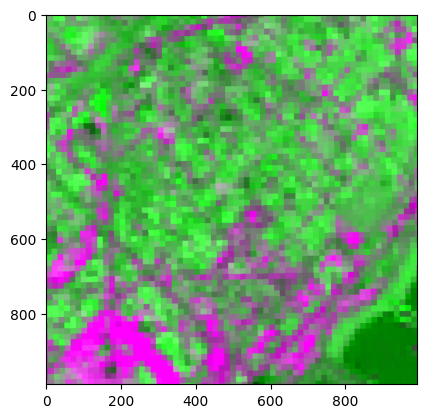

In [24]:
plt.imshow(get_ndvi_ndbi_image(2015))

## **Image Segmentation**


> Select segmentation methods to extract features
*(e.g. color/line/shape detection)*


### Greenery classification using color and edge detection

> As a first approach we aimed at classifing tall greenery from grass by overlaping the detected green elements with the shadow casted by them. for this, a binary mask using adaptative threshold was generated and the overlaped with the detected green areas, the intersection was used for the segmentation of the tree elements. 
Aside from further tuning of the color and threshold ranges, some other inherit limitations have to be taken into account.
1. 

tile_41.396536_2.194554_r1_c2.png


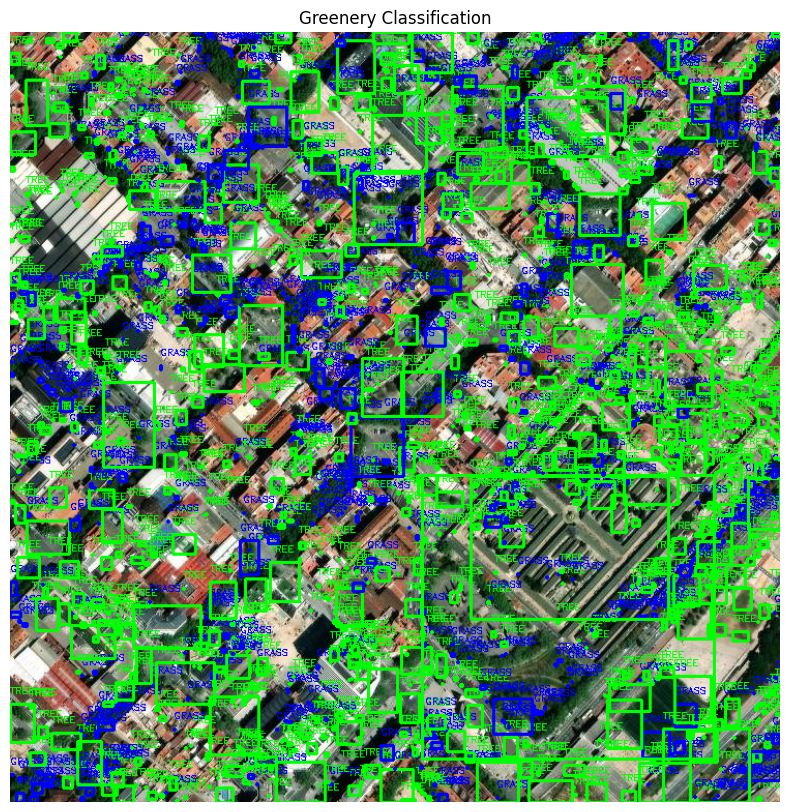

tile_41.396536_2.194554_r2_c1.png


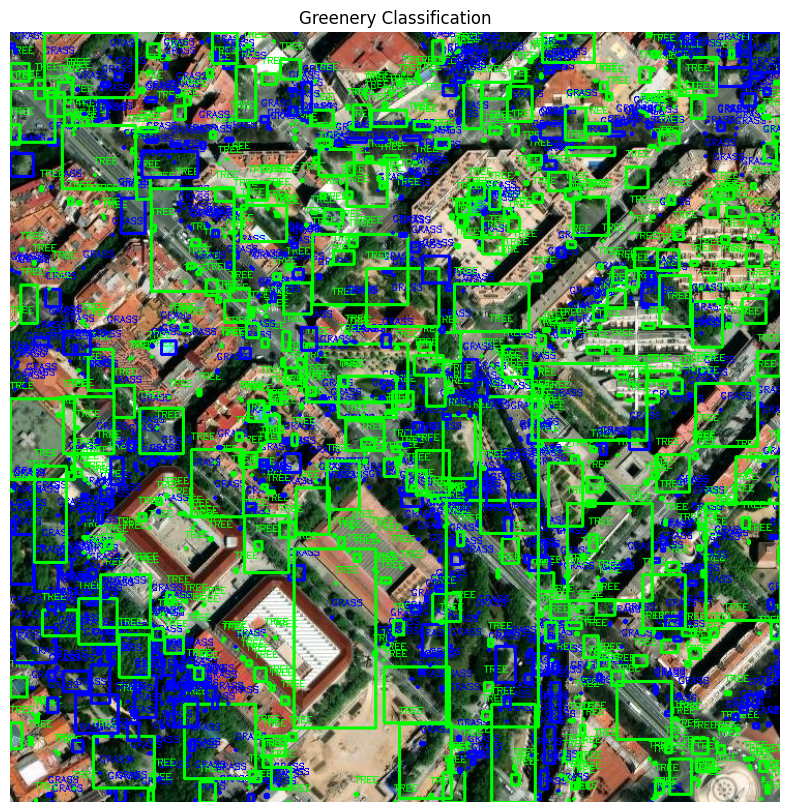

tile_41.396536_2.194554_r1_c1.png


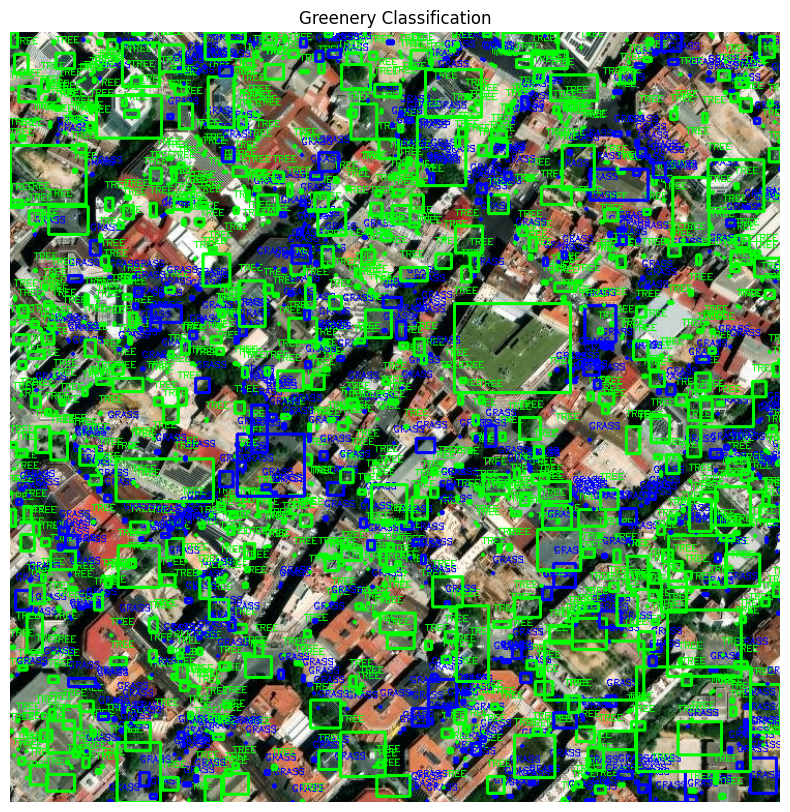

tile_41.396536_2.194554_r0_c0.png


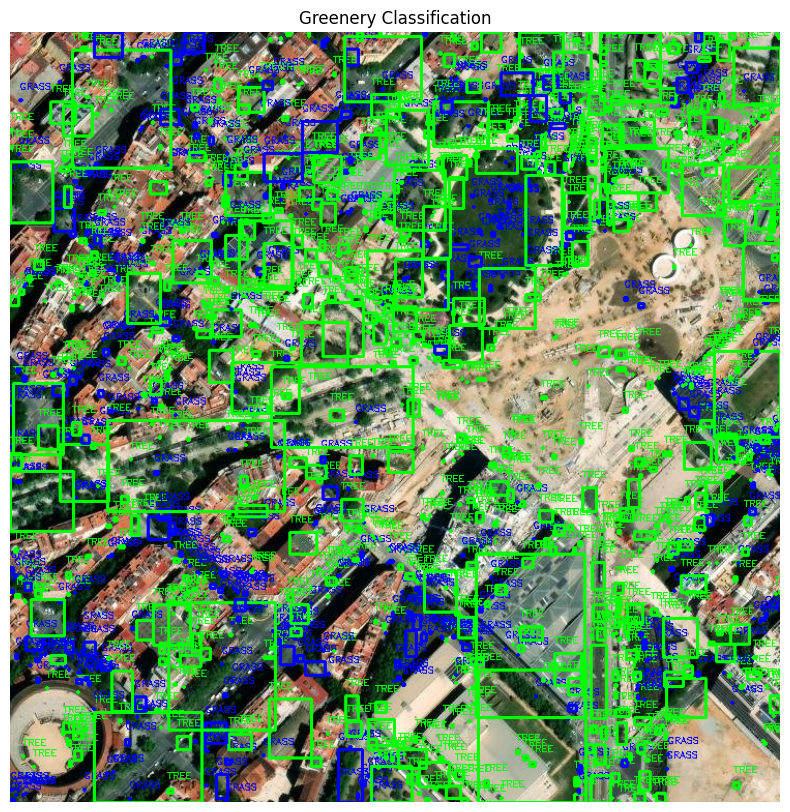

tile_41.396536_2.194554_r1_c0.png


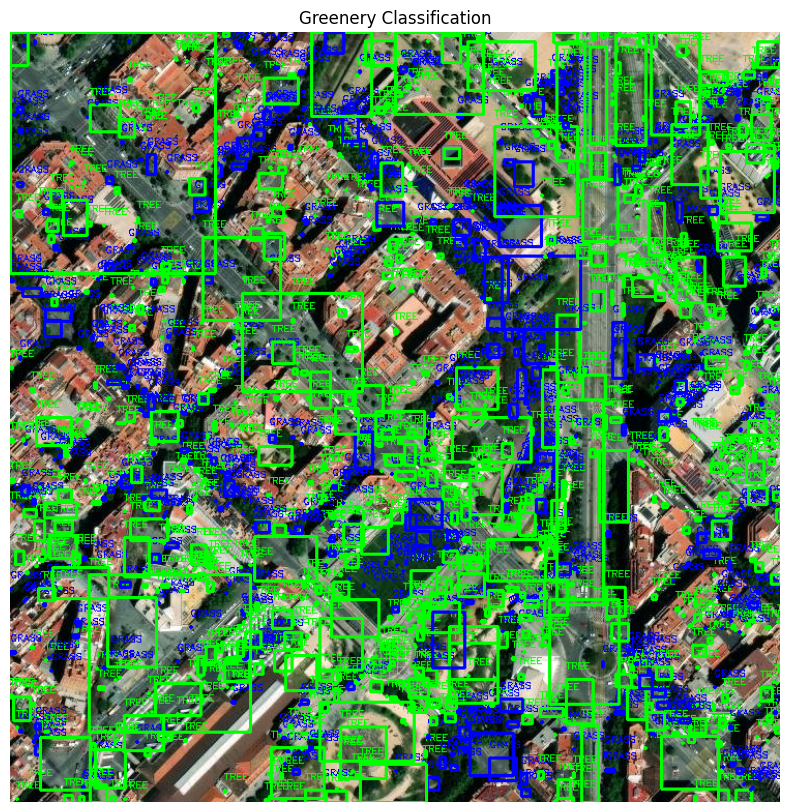

tile_41.396536_2.194554_r0_c2.png


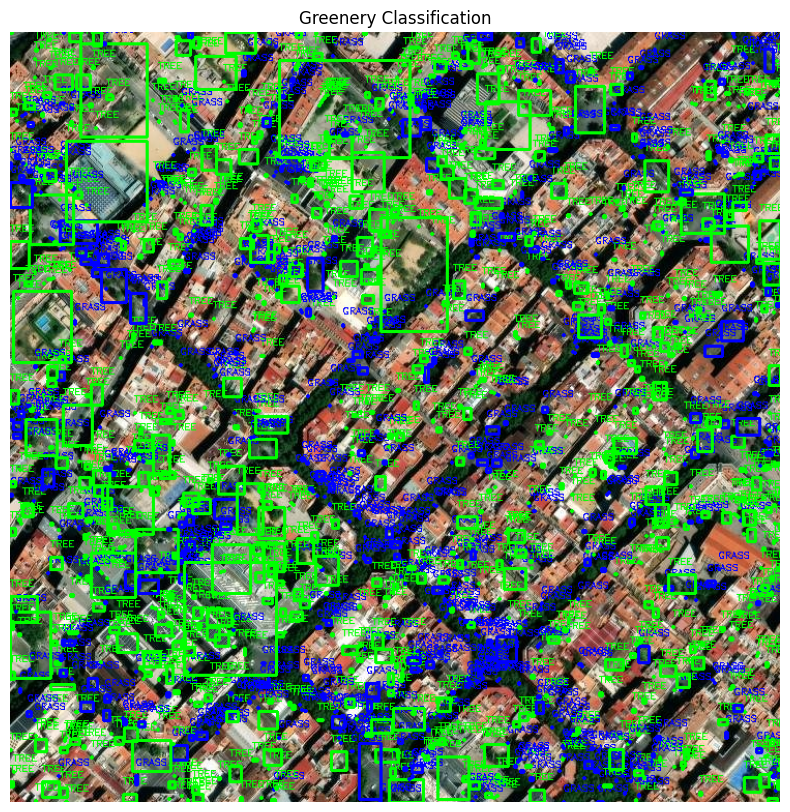

tile_41.396536_2.194554_r2_c0.png


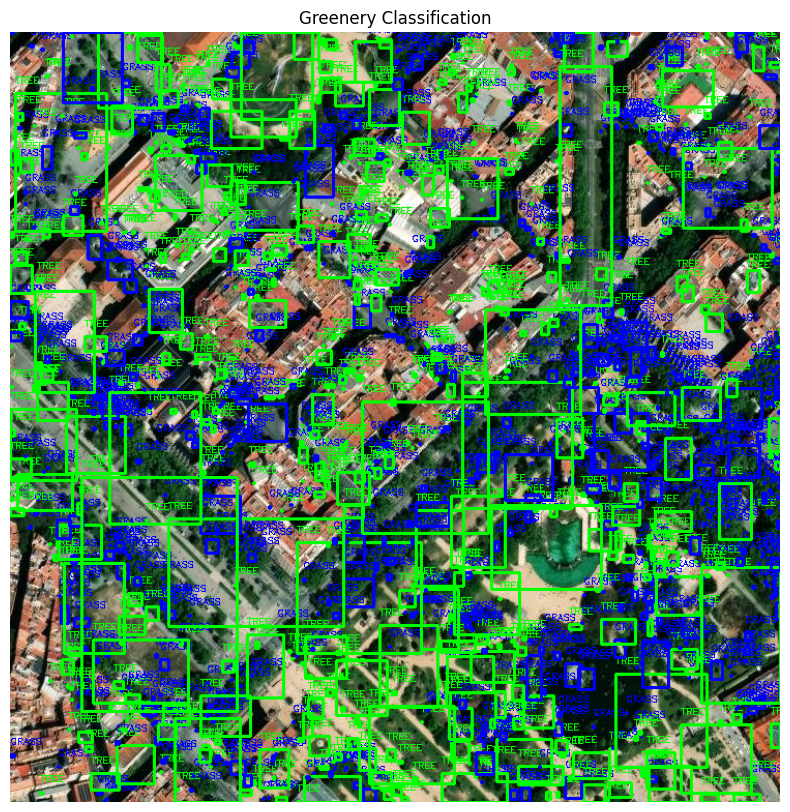

tile_41.396536_2.194554_r0_c1.png


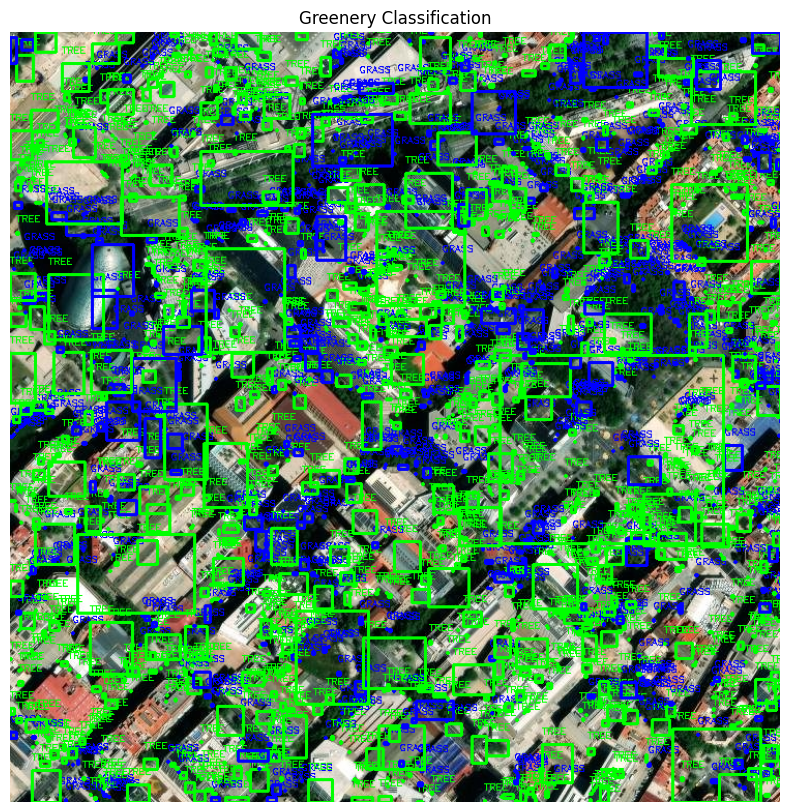

tile_41.396536_2.194554_r2_c2.png


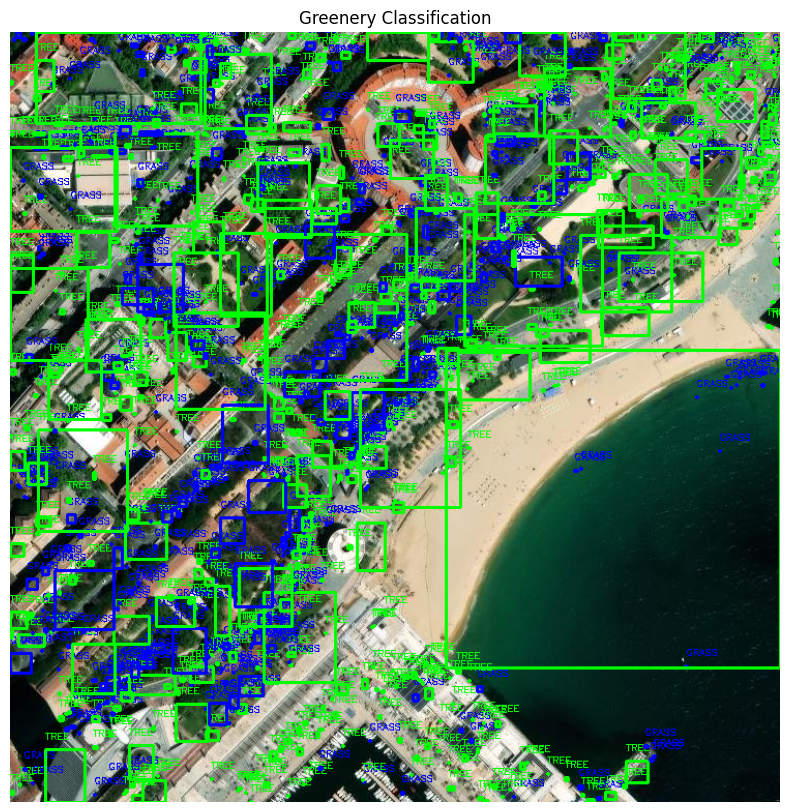

In [ ]:
def classify_greenery(image_path):
    
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    green_lower = np.array([35,50,90], dtype="uint8")
    green_upper = np.array([90,255,255], dtype="uint8")

    green_mask = cv2.inRange(image_hsv, green_lower, green_upper)

    green_mask = cv2.morphologyEx(green_mask, cv2.MORPH_CLOSE, np.ones((5, 5), np.uint8))


    # Detect shadows
    shadow_mask = cv2.adaptiveThreshold(image_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 2)
    contours, _ = cv2.findContours(green_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Classifying
    for contour in contours:

        green_area_mask = np.zeros_like(green_mask)
        cv2.drawContours(green_area_mask, [contour], -1, 255, -1)

        overlap = cv2.bitwise_and(green_area_mask, shadow_mask)
        overlap_area = np.count_nonzero(overlap)
        green_area = np.count_nonzero(green_area_mask)

        # Classification based on shadow overlap
        if overlap_area / green_area > 0.3:
            classification = "TREE"
            color = (0, 255, 0)
        else:
            classification = "GRASS"
            color = (0, 0, 255)  # Blue

        # Draw the classification on the image
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(image_rgb, (x, y), (x + w, y + h), color, 2)
        cv2.putText(image_rgb, classification, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.3, color, 1)

    # Display
    plt.figure(figsize=(10, 10))
    plt.imshow(shadow_mask, cmap='gray')
    plt.imshow(image_rgb)
    plt.axis("off")
    plt.title("Greenery Classification")
    plt.show()

# Main
for file in os.listdir("/home/salvador_cb/3_term/environmental_data_workshop/data/efficient_tiles"):
    print(file)
    classify_greenery(f"/home/salvador_cb/3_term/environmental_data_workshop/data/efficient_tiles/{file}")

### Greenery classification using CNNs and lidar input
>

**KPI's**


> Use the extracted features to suggest urban resilience metrics in the form of graphs *(e.g. NDVI, green index, thermal index)*

